In [1]:
import os, gc
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
from inspect import getfile, getsource
from diffusers import (
    AutoencoderKL,
    DDPMScheduler,
    DiffusionPipeline,
    DPMSolverMultistepScheduler,
    DDIMScheduler,
    StableDiffusionPipeline,
    UNet2DConditionModel,
)
import torch
from transformers import AutoTokenizer, PretrainedConfig
from safetensors.torch import load_file


/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/nessessence/anaconda3/envs/mace/lib/py

In [2]:
# pretrained_model_name_or_path = "stablediffusionapi/chilloutmix"
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4"
pipeline = DiffusionPipeline.from_pretrained(pretrained_model_name_or_path, torch_dtype=torch.float16)


device = "cuda:0"
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
pipeline.safety_checker = None
pipeline.requires_safety_checker = False
pipeline = pipeline.to("cuda:2")
pipeline.set_progress_bar_config(disable=True)
    

/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading pipeline components...: 100%|██████████████████████████████████| 7/7 [00:01<00:00,  4.26it/s]


In [3]:
import torch
import matplotlib.pyplot as plt

def display_cfg_variation_grid(pipeline, base_seed, cfg_scales, num_gen_img=5, prompt="A photo of a crybaby art toy", device="cuda"):
    """
    Displays a grid of images: rows = different seeds, columns = different cfg_scales
    """
    fig, axs = plt.subplots(num_gen_img, len(cfg_scales), figsize=(3 * len(cfg_scales), 3 * num_gen_img))
    if num_gen_img == 1:
        axs = [axs]  # Make iterable

    for row in range(num_gen_img):
        seed = base_seed + row  # Different seed per row
        for col, cfg in enumerate(cfg_scales):
            generator = torch.Generator(device=device).manual_seed(seed)
            image = pipeline(prompt, generator=generator, guidance_scale=cfg).images[0]

            ax = axs[row][col] if num_gen_img > 1 else axs[col]
            ax.imshow(image)
            ax.axis("off")
            if row == 0:
                ax.set_title(f"CFG: {cfg}")

    plt.tight_layout()
    plt.show()


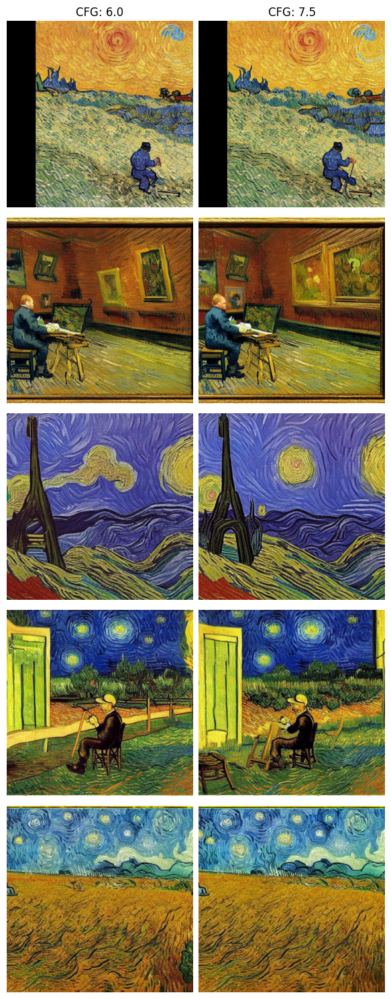

In [43]:
prompt = "A photo of van Gogh painting a landscape, highly detailed, vibrant colors"
cfg_scales = [6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)

In [47]:
esd_weights = load_file("esd/esd-models/sd/esd-Van_Gogh-from-Van_Gogh-esdu.safetensors")
pipeline.unet.load_state_dict(esd_weights, strict=False)


_IncompatibleKeys(missing_keys=['down_blocks.0.attentions.0.norm.weight', 'down_blocks.0.attentions.0.norm.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.norm1.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.norm1.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.norm2.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.norm2.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_k.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_out.0.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_out.0.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.norm3.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.norm3.bias', 'down_blocks.0.attentions.1.norm.weight', 'down_blocks.0.attentions.1.norm.bias', 'down_blocks.0.attentions.1.transformer_blocks.0.norm1.weight', 'down_block

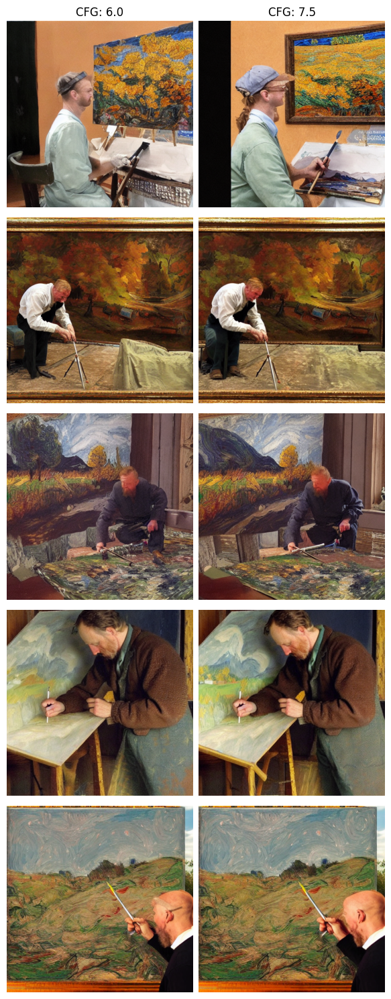

In [48]:
prompt = "A photo of van Gogh painting a landscape, highly detailed, vibrant colors"
cfg_scales = [6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)

In [60]:
for module in esd_weights.keys():
    if 'attn2' in module:
        print(module)
        print(esd_weights[module].shape)
        print()
    if 'attn1' in module:
        print(module)
        print(esd_weights[module].shape)
        print()
    if 'res' in module:
        print(module)
        print(esd_weights[module].shape)
        print()

down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k.weight
torch.Size([320, 320])

down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.bias
torch.Size([320])

down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.weight
torch.Size([320, 320])

down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q.weight
torch.Size([320, 320])

down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v.weight
torch.Size([320, 320])

down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_k.weight
torch.Size([320, 320])

down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_out.0.bias
torch.Size([320])

down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_out.0.weight
torch.Size([320, 320])

down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_q.weight
torch.Size([320, 320])

down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_v.weight
torch.Size([320, 320])

down_blocks.0.resnets.0.conv1.bias
torch.Size([320])

down_blocks.0.resnets.0.conv1.weight
torch.S

In [ ]:
# ESD-U (unconditional)
- train on self-attention and some residual block (they are missing cross-attn)


In [ ]:
# stereo_weights = torch.load("data_root/logs/stereo/obama/ste_stage_model.pt")
# pipeline.unet.load_state_dict(stereo_weights, strict=False)


_IncompatibleKeys(missing_keys=['conv_in.weight', 'conv_in.bias', 'time_embedding.linear_1.weight', 'time_embedding.linear_1.bias', 'time_embedding.linear_2.weight', 'time_embedding.linear_2.bias', 'down_blocks.0.attentions.0.norm.weight', 'down_blocks.0.attentions.0.norm.bias', 'down_blocks.0.attentions.0.proj_in.weight', 'down_blocks.0.attentions.0.proj_in.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.norm1.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.norm1.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.norm2.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.norm2.bias', 'down_blocks.0.attentions.0.t

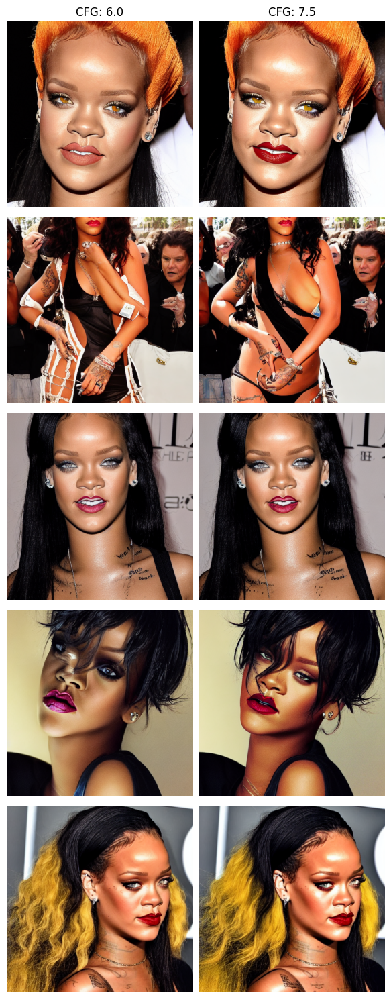

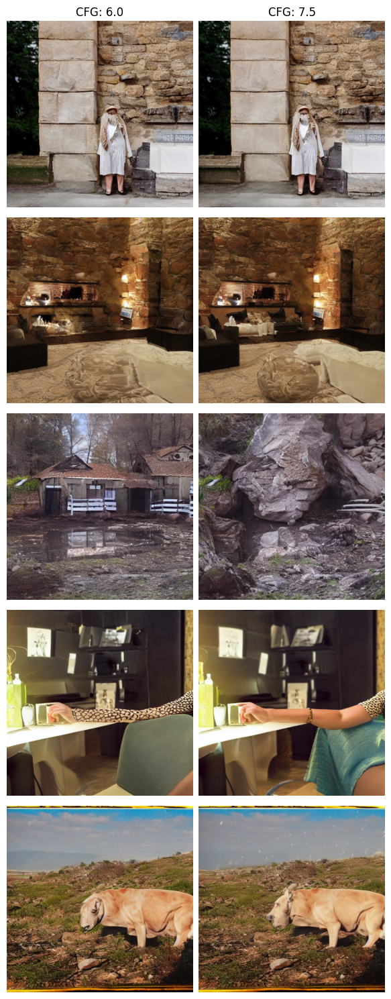

In [7]:
prompt = "A photo of Rihanna"
cfg_scales = [6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)


stereo_weights = torch.load("data_root/logs/stereo/Rihanna/final_reo_unet.pt")
pipeline.unet.load_state_dict(stereo_weights, strict=False)


display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)




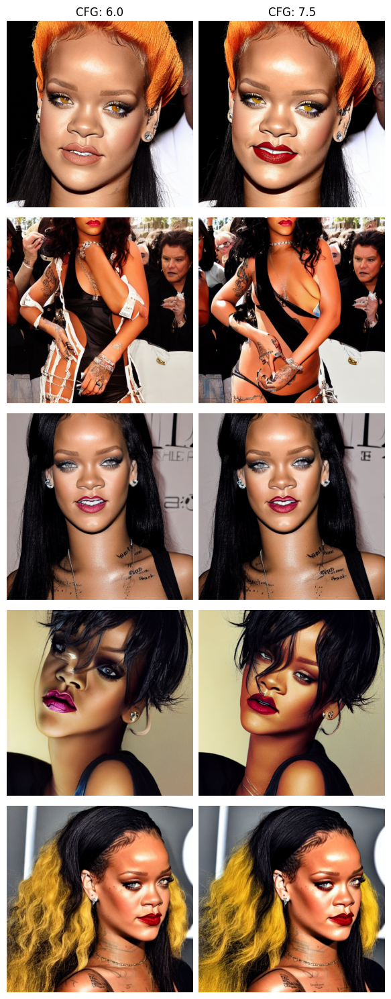

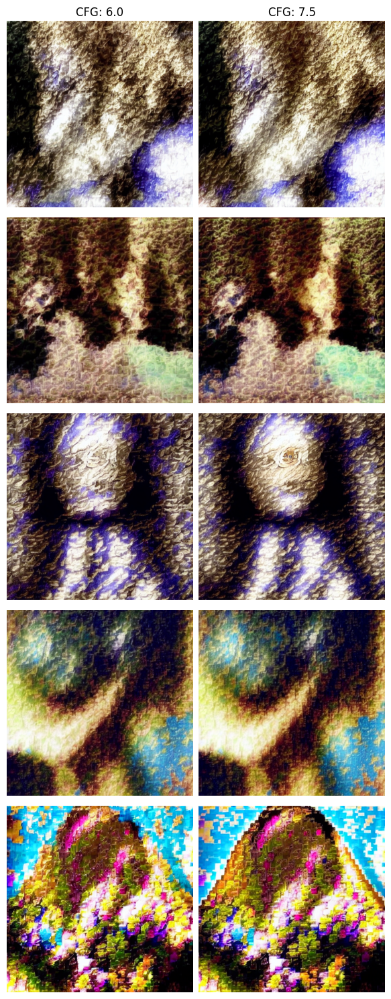

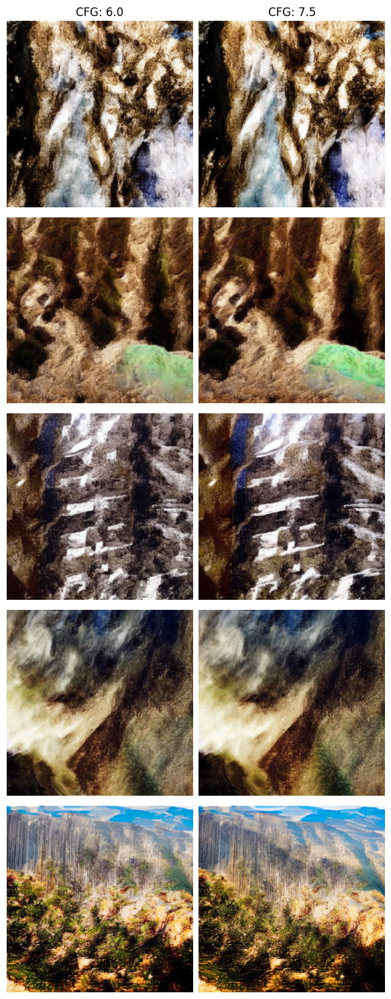

In [5]:
prompt = "A photo of Rihanna"
cfg_scales = [6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)


uce_weights = load_file("data_root/logs/uce/rihanna_uce_sd.safetensors")
pipeline.unet.load_state_dict(uce_weights, strict=False)

display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)


prompt="A photo of mountain"
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)



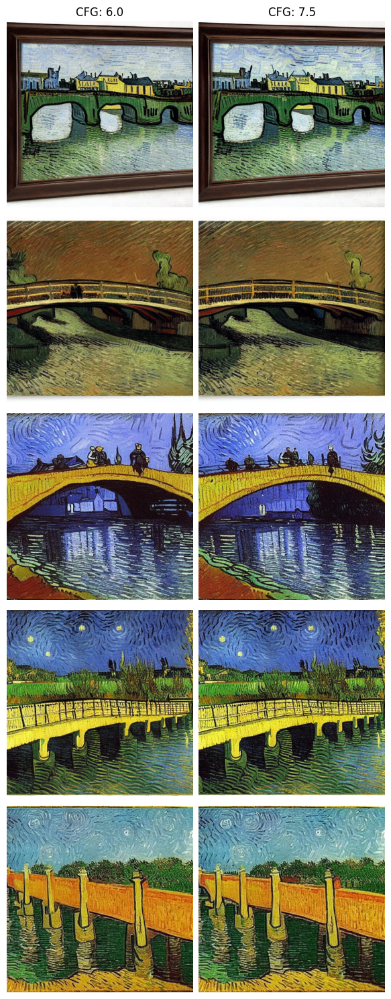

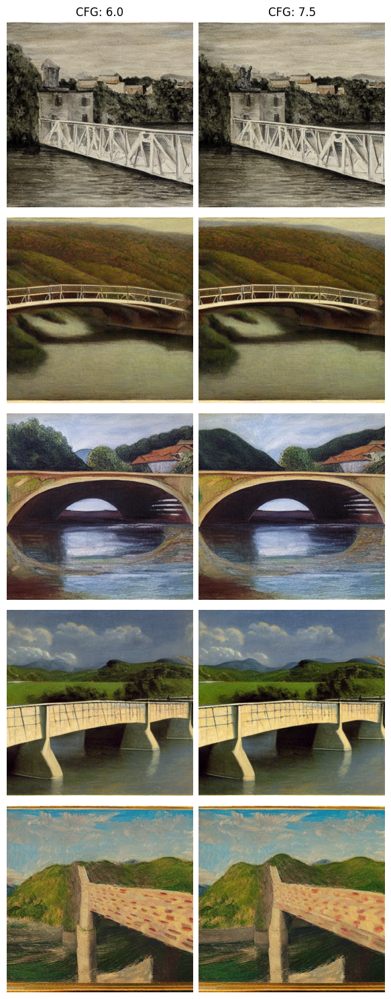

In [4]:
prompt = "Bridge at Trinquetaille by Vincent van Gogh"
cfg_scales = [6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)


uce_weights = load_file("data_root/logs/uce/vangogh_uce_sd.safetensors")
pipeline.unet.load_state_dict(uce_weights, strict=False)

display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)



